In [1]:
import numpy as np
import matplotlib.pyplot as plt
from numba import jit
@jit
def solvepoissonvonneumann3d(b,niter):
    # b: matrise med randverdier, nan hvor vi skal finne V
    # niter: antall iterasjoner
    # V: returnerer potensialet
    V = b.copy()
    for i in range(len(V.flat)):
        if (np.isnan(b.flat[i])):
            V.flat[i] = 0.0
    Vnew = V.copy()
    Lx = b.shape[0]
    Ly = b.shape[1]
    Lz = b.shape[2]
    for n in range(niter):
        for ix in range(Lx):
            for iy in range(Ly):
                for iz in range(Lz):
                    ncount = 0
                    Vsum = 0.0
                    if (np.isnan(b[ix,iy,iz])):
                        if (ix>0):
                            Vsum = Vsum + V[ix-1,iy,iz]
                            ncount = ncount + 1
                        if (ix<Lx-1):
                            Vsum = Vsum + V[ix+1,iy,iz]
                            ncount = ncount + 1
                        if (iy>0):
                            Vsum = Vsum + V[ix,iy-1,iz]
                            ncount = ncount + 1
                        if (iy<Ly-1):
                            Vsum = Vsum + V[ix,iy+1,iz]
                            ncount = ncount + 1
                        if (iz>0):
                            Vsum = Vsum + V[ix,iy,iz-1]
                            ncount = ncount + 1
                        if (iz<Lz-1):
                            Vsum = Vsum + V[ix,iy,iz+1]
                            ncount = ncount + 1
                        Vnew[ix,iy,iz] = Vsum/ncount
        V,Vnew = Vnew,V
    return V

In [3]:
L = 50
b = np.zeros((L,L,L))
b[:] = np.float('nan')

h = 10
a = 5
cx = L/2
cy = L/2
cz = h

for ix in range(L):
    for iy in range(L):
        for iz in range(L):
            dx = ix - cx
            dy = iy - cy
            dz = iz - cz
            d = np.sqrt(dx*dx + dy*dy + dz*dz)
            if (d<a):
                b[ix,iy,iz] = 1.0

b[:,:,0] = 1.0
b[:,:,L-1] = 0.0

In [4]:
V = solvepoissonvonneumann3d(b,10000)

In [5]:
import plotly.graph_objects as go
x = np.linspace(0,L-1,L)
y = np.linspace(0,L-1,L)
z = np.linspace(0,L-1,L)
rx,ry,rz = np.meshgrid(x,y,z)
fig = go.Figure(data=go.Volume(
    x=rx.flatten(),
    y=ry.flatten(),
    z=rz.flatten(),
    value=V.flatten(),
    isomin=0.0,
    isomax=1.0,
    opacity=0.1,
    surface_count=20, # nr of isosurfaces
    ))
fig.show()

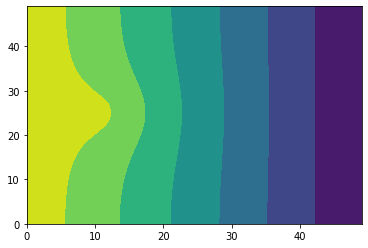

In [14]:
islice = 19
Vs = V[:,islice,:]
plt.contourf(Vs)

In [8]:
Ez,Ey,Ex = np.gradient(-V)

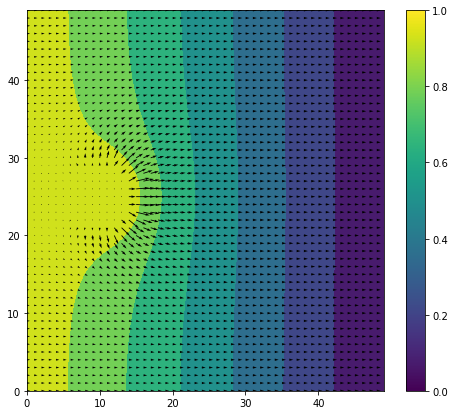

In [19]:
islice = 25
plt.figure(figsize=(8,7))
plt.contourf(V[:,islice,:])
plt.quiver(Ex[:,islice,:],Ez[:,islice,:])
plt.colorbar()

In [10]:
Emag = Ex*Ex + Ey*Ey + Ez*Ez
print(max(Emag.flat))

0.006526732610878152
